In [2]:
pip install Levenshtein

Note: you may need to restart the kernel to use updated packages.


In [3]:
pip install pm4py

Note: you may need to restart the kernel to use updated packages.


In [4]:
import pandas as pd
import pm4py
import Levenshtein as lev
import numpy as np
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score
import scipy.cluster.hierarchy as sch
from sklearn.cluster import AgglomerativeClustering
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from collections import Counter
import ast
from sklearn.cluster import KMeans

In [5]:
# Preprocessing

# Charger les logs (similaire à pm4py.read_xes)
log = pm4py.read_xes("datasets/renting_log_high.xes")

# Récupérer les variants
variants = pm4py.get_variants(log)

# Extraire toutes les activités distinctes dans le log
activities = set()
for variant in variants:
    activities.update(variant)

# Trier les activités pour garantir un ordre uniforme
activities = sorted(activities)

# Créer une liste vide pour stocker les lignes du DataFrame
data = []

# Remplir la liste avec les fréquences des activités pour chaque variant
for idx, variant in enumerate(variants, start=1):
    # Compter le nombre d'occurrences de chaque activité dans le variant
    frequency_list = [variant.count(activity) for activity in activities]

    # Ajouter l'ID du variant et la liste de fréquences
    data.append([idx, frequency_list])

# Créer le DataFrame avec les deux colonnes
df = pd.DataFrame(data, columns=["variant_id", "frequency_array"])

df.to_csv("ProcessedLogs.csv", index=False)

# Afficher le DataFrame
print(df)


c:\Users\valmo\AppData\Local\Programs\Python\Python312\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
parsing log, completed traces :: 100%|██████████| 10000/10000 [00:03<00:00, 3006.14it/s]


     variant_id                                    frequency_array
0             1   [2, 1, 1, 0, 1, 1, 2, 2, 1, 8, 0, 1, 1, 1, 1, 1]
1             2   [0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 1]
2             3   [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1]
3             4   [0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 1]
4             5   [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0]
..          ...                                                ...
491         492  [3, 1, 1, 0, 1, 1, 3, 3, 1, 13, 0, 1, 1, 1, 1, 1]
492         493  [3, 1, 1, 0, 1, 1, 3, 3, 1, 26, 0, 1, 1, 1, 1, 1]
493         494  [1, 1, 1, 0, 0, 1, 1, 1, 1, 14, 0, 1, 1, 1, 1, 1]
494         495  [2, 1, 1, 0, 0, 1, 2, 2, 1, 15, 0, 1, 1, 1, 1, 1]
495         496  [2, 1, 1, 0, 1, 1, 2, 2, 1, 28, 0, 1, 1, 1, 1, 1]

[496 rows x 2 columns]


In [6]:
# Calcul de la matrice de proximité

# Fonction pour calculer la distance Euclidienne entre deux vecteurs
def euclidean_distance_matrix(frequency_arrays, block_size=50):
    num_traces = frequency_arrays.shape[0]
    # Créer une matrice vide pour stocker les distances
    euclidean_matrix = np.zeros((num_traces, num_traces))

    # Calcul par blocs
    for i in range(0, num_traces, block_size):
        for j in range(i, num_traces, block_size):
            # Calculer la distance entre les sous-matrices de taille block_size
            block_i = frequency_arrays[i:i+block_size]
            block_j = frequency_arrays[j:j+block_size]

            # Calcul de la différence carrée entre les vecteurs de fréquence
            diff = block_i[:, np.newaxis] - block_j  # Différence entre chaque pair de vecteurs
            dist = np.sqrt(np.sum(diff**2, axis=2))  # Calcul de la distance Euclidienne

            # Stocker les résultats dans la matrice
            euclidean_matrix[i:i+block_size, j:j+block_size] = dist
            euclidean_matrix[j:j+block_size, i:i+block_size] = dist.T

    return euclidean_matrix

# Lire le fichier CSV et extraire les fréquences
data = pd.read_csv('ProcessedLogs.csv')

# Convertir la colonne 'frequency_array' en une matrice numpy
frequency_arrays = np.array([ast.literal_eval(freq) for freq in data['frequency_array']])

# Calculer la matrice de distance Euclidienne par blocs
proximity_df = euclidean_distance_matrix(frequency_arrays, block_size=50)

# Remplir la diagonale avec 0 (distance d'un cas à lui-même)
np.fill_diagonal(proximity_df, 0)

# Afficher la matrice de proximité
print(proximity_df)

print(len(proximity_df))

[[ 0.          9.          9.16515139 ...  6.32455532  7.07106781
  20.        ]
 [ 9.          0.          1.73205081 ... 14.24780685 15.5241747
  28.3019434 ]
 [ 9.16515139  1.73205081  0.         ... 14.35270009 15.62049935
  28.35489376]
 ...
 [ 6.32455532 14.24780685 14.35270009 ...  0.          2.
  14.14213562]
 [ 7.07106781 15.5241747  15.62049935 ...  2.          0.
  13.03840481]
 [20.         28.3019434  28.35489376 ... 14.14213562 13.03840481
   0.        ]]
496


Hauteur de coupe optimale (méthode du coude) : 289.05


C:\Users\valmo\AppData\Local\Temp\ipykernel_27680\1614360359.py:50: ClusterWarning: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  linkage_matrix = linkage(proximity_df, method='single')  # Calculer la matrice de linkage


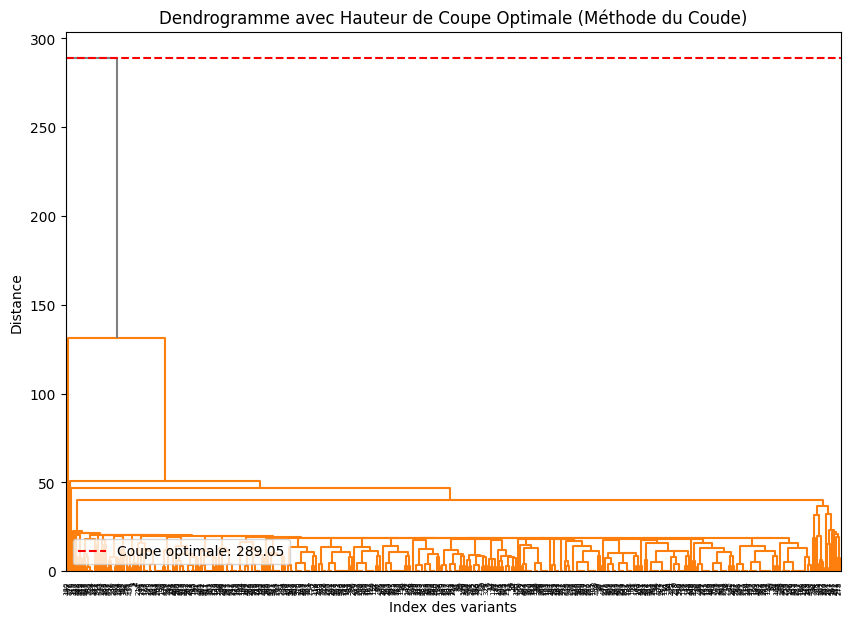

In [7]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import linkage, dendrogram

def afficher_dendrogramme_coupe_optimale(distances, linkage_matrix):
    """
    Affiche le dendrogramme avec une hauteur de coupe optimale basée sur la méthode du coude.
    :param distances: Les distances de fusion extraites de la matrice de linkage.
    :param linkage_matrix: Matrice de linkage calculée à partir des données.
    """
    # Exclure les distances nulles
    valid_distances = distances[distances > 0]

    # Vérifier que les distances non nulles existent
    if len(valid_distances) <= 1:
        print("Pas assez de distances non nulles pour appliquer la méthode du coude.")
        return

    # Trier les distances non nulles (par sécurité)
    sorted_distances = np.sort(valid_distances)

    # Calculer les différences successives (dérivée première)
    distance_diffs = np.diff(sorted_distances)

    # Identifier l'indice du coude (plus grande différence)
    optimal_cut_index = np.argmax(distance_diffs)
    optimal_cut_height = sorted_distances[optimal_cut_index + 1]

    print(f"Hauteur de coupe optimale (méthode du coude) : {optimal_cut_height:.2f}")

    # Génération du dendrogramme
    plt.figure(figsize=(10, 7))
    dendro = dendrogram(
        linkage_matrix,
        color_threshold=optimal_cut_height,  # Utiliser la hauteur optimale pour colorer les branches
        above_threshold_color='gray',       # Couleur des branches au-dessus du seuil
    )

    # Superposer une ligne pour la hauteur de coupe optimale
    plt.axhline(y=optimal_cut_height, color='red', linestyle='--', label=f'Coupe optimale: {optimal_cut_height:.2f}')

    # Ajouter des légendes et des titres
    plt.title("Dendrogramme avec Hauteur de Coupe Optimale (Méthode du Coude)")
    plt.xlabel("Index des variants")
    plt.ylabel("Distance")
    plt.legend()
    plt.show()

# Exemple d'utilisation
linkage_matrix = linkage(proximity_df, method='single')  # Calculer la matrice de linkage
distances = linkage_matrix[:, 2]  # Extraire les distances de fusion
afficher_dendrogramme_coupe_optimale(distances, linkage_matrix)


Silhouette score pour 2 clusters: 0.562696635723114
Silhouette score pour 3 clusters: 0.504902184009552
Silhouette score pour 4 clusters: 0.5077332258224487
Silhouette score pour 5 clusters: 0.5085803866386414
Silhouette score pour 6 clusters: 0.48470571637153625
Silhouette score pour 7 clusters: 0.49568095803260803
Silhouette score pour 8 clusters: 0.441645085811615
Silhouette score pour 9 clusters: 0.47820794582366943


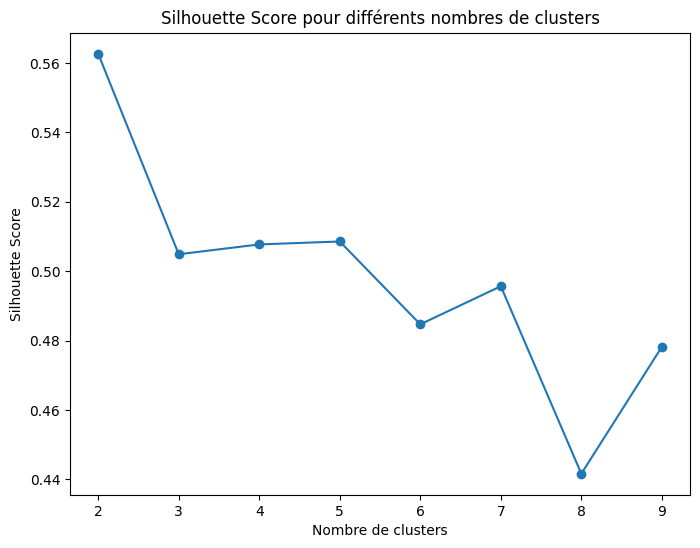

Le nombre optimal de clusters est : 2


In [ ]:
# Réduire les dimensions avec t-SNE
tsne = TSNE(n_components=2, metric="precomputed", random_state=42, init="random")
X_tsne = tsne.fit_transform(proximity_df)

# Initialisation de la liste pour stocker les scores de silhouette
silhouette_scores = []

# Tester différents nombres de clusters avec KMeans
range_n_clusters = list(range(2, 10))  # On teste de 2 à 10 clusters

for n_clusters in range_n_clusters:
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    kmeans_labels = kmeans.fit_predict(X_tsne)

    # Calculer le silhouette score pour le nombre de cluster actuel
    score = silhouette_score(X_tsne, kmeans_labels)
    silhouette_scores.append(score)

    print(f"Silhouette score pour {n_clusters} clusters: {score}")

# Visualisation du silhouette score en fonction du nombre de clusters
plt.figure(figsize=(8, 6))
plt.plot(range_n_clusters, silhouette_scores, marker='o')
plt.title("Silhouette Score pour différents nombres de clusters")
plt.xlabel("Nombre de clusters")
plt.ylabel("Silhouette Score")
plt.show()

# Trouver le nombre optimal de clusters (maximisant le silhouette score)
optimal_n_clusters = range_n_clusters[np.argmax(silhouette_scores)]
print(f"Le nombre optimal de clusters est : {optimal_n_clusters}")


C:\Users\valmo\AppData\Local\Temp\ipykernel_27680\864789866.py:14: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  scatter = plt.scatter(X_tsne[:, 0], X_tsne[:, 1], cmap='Set1', s=100, edgecolors='k', alpha=0.7)


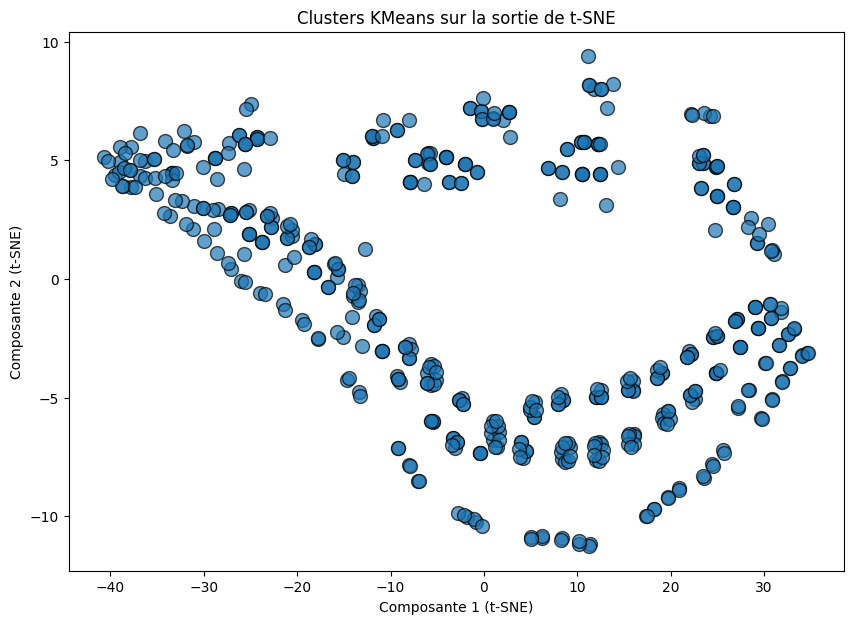

In [9]:
# Affichage des clusters avec le nombre de clusters optimal

import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
import numpy as np

tsne = TSNE(n_components=2, metric="precomputed", random_state=42, init="random")
X_tsne = tsne.fit_transform(proximity_df)


# Visualiser les clusters avec une palette de couleurs plus contrastée
plt.figure(figsize=(10, 7))
scatter = plt.scatter(X_tsne[:, 0], X_tsne[:, 1], cmap='Set1', s=100, edgecolors='k', alpha=0.7)
plt.title("Clusters KMeans sur la sortie de t-SNE")
plt.xlabel("Composante 1 (t-SNE)")
plt.ylabel("Composante 2 (t-SNE)")

plt.show()


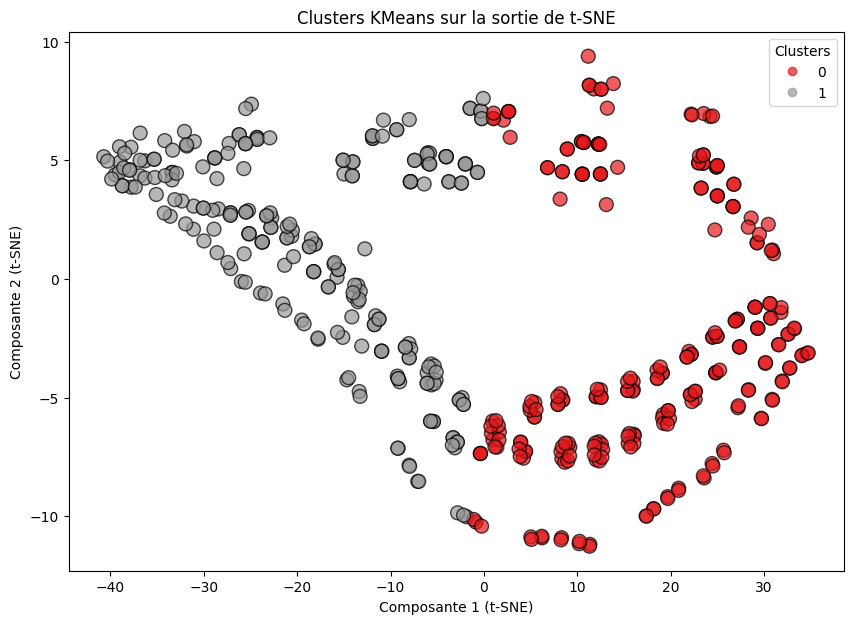

In [10]:
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
import numpy as np

# Supposons que 'X' est le tableau des fréquences des variantes (par exemple, les données du DataFrame)
# X = df['frequency_array'].apply(lambda x: np.array(eval(x))).tolist()
# Assurez-vous que X est un tableau de numpy.ndarray ou de listes
tsne = TSNE(n_components=2, metric="precomputed", random_state=42, init="random")
X_tsne = tsne.fit_transform(proximity_df)
# Appliquer t-SNE pour réduire la dimensionnalité des données

# Appliquer KMeans pour effectuer le clustering
kmeans = KMeans(n_clusters=2, random_state=56)  # Remplacez le nombre de clusters (3) par le nombre optimal
kmeans.fit(X_tsne)

# Obtenir les étiquettes des clusters
labels = kmeans.labels_

# Visualiser les clusters avec une palette de couleurs plus contrastée
plt.figure(figsize=(10, 7))
scatter = plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=labels, cmap='Set1', s=100, edgecolors='k', alpha=0.7)
plt.title("Clusters KMeans sur la sortie de t-SNE")
plt.xlabel("Composante 1 (t-SNE)")
plt.ylabel("Composante 2 (t-SNE)")

# Ajouter une légende pour les clusters
plt.legend(*scatter.legend_elements(), title="Clusters")

# Afficher le graphique
plt.show()


In [11]:
import pm4py
import pandas as pd
from collections import defaultdict

# Initialiser un dictionnaire pour stocker les identifiants de cas par variante
variant_cases_dict = defaultdict(list)

# Créer un dictionnaire pour mapper les séquences d'activités à des variantes
sequence_to_variant = {}


# Grouper par 'case_id' pour récupérer les séquences d'activités
for case_id, group in log.groupby('case:concept:name'):
    # Créer la séquence d'activités pour chaque cas
    activity_sequence = tuple(group['activity'])

    # Si cette séquence n'a pas encore de variante, l'ajouter à sequence_to_variant
    if activity_sequence not in sequence_to_variant:
        sequence_to_variant[activity_sequence] = len(sequence_to_variant)  # Assigner un nouvel ID de variant

    # Récupérer l'ID de variant pour cette séquence
    variant_id = sequence_to_variant[activity_sequence]

    # Ajouter l'identifiant du cas au dictionnaire pour cette variante
    variant_cases_dict[variant_id].append(case_id)


clusterOfVariantID = {}


for variant, case_ids in variant_cases_dict.items():
    # S'assurer que l'étiquette est valide
    if variant < len(labels):  # Vérifiez que variant est un indice valide
        label = labels[variant]
    else:
        label = "default"  # Valeur par défaut si 'variant' est hors limites

    # Ajouter les cas dans le cluster approprié
    if label not in clusterOfVariantID:
        clusterOfVariantID[label] = []

    clusterOfVariantID[label].extend(case_ids)

    # Optionnel : afficher les cas regroupés par label
    print(f"Cluster pour {label}: {clusterOfVariantID[label]}")



Cluster pour 0: ['1']
Cluster pour 0: ['1', '10', '100', '1001', '1004', '1005', '1008', '1011', '1012', '1020', '1022', '1027', '1030', '1035', '1037', '1041', '1045', '1046', '1048', '105', '1055', '1056', '1058', '1059', '106', '1063', '1066', '1069', '107', '1074', '1075', '1077', '1079', '108', '1080', '1081', '1082', '1083', '1086', '1087', '1089', '1092', '1097', '1098', '1099', '1101', '1103', '1108', '1109', '1110', '1122', '1125', '1130', '1133', '1135', '1140', '1147', '1149', '1157', '1160', '1164', '1165', '1167', '1170', '1189', '1195', '1196', '1198', '1201', '1202', '1211', '1216', '1217', '1218', '1233', '1247', '1248', '1257', '1259', '126', '1261', '1263', '1268', '127', '1271', '1273', '1277', '128', '1282', '1285', '1288', '1290', '1298', '13', '1305', '1309', '131', '1314', '1319', '132', '1322', '1323', '1324', '1328', '1330', '1331', '1333', '1340', '1343', '1347', '1348', '135', '1351', '1356', '1357', '1358', '1359', '1362', '1363', '1367', '1372', '1375', '13

In [12]:
import pm4py
import pandas as pd

# Charger le fichier XES contenant toutes les traces (ici on obtient un DataFrame)
xes_file = "datasets/renting_log_high.xes"  # Remplacez par votre fichier XES
log_df = pm4py.read_xes(xes_file)  # Ceci renvoie un DataFrame


# Nom des colonnes
case_id_column = "case:concept:name"  # Utilisez "concept:name" pour l'ID de cas dans le XES
activity_column = "concept:name"  # Utilisez "activity" pour le nom de l'activité dans le XES
timestamp_column = "time:timestamp"  # Utilisez "time:timestamp" pour le timestamp

# Créer un fichier XES pour chaque cluster
for cluster_id, case_ids in clusterOfVariantID.items():
    # Filtrer les traces dont l'ID du cas est dans le cluster
    cluster_df = log_df[log_df[case_id_column].isin(case_ids)]

    # Créer un EventLog vide pour ce cluster
    cluster_log = pm4py.objects.log.obj.EventLog()

    # Regrouper les événements par 'case_id' (traces dans le même cas)
    for case_id in case_ids:
        case_df = cluster_df[cluster_df[case_id_column] == case_id].sort_values(by=timestamp_column)

        # Créer une nouvelle trace pour chaque 'case_id'
        trace = pm4py.objects.log.obj.Trace()
        trace.attributes[case_id_column] = case_id
        # Ajouter tous les événements du cas dans la trace
        for _, row in case_df.iterrows():
            event = pm4py.objects.log.obj.Event()
            event[activity_column] = row[activity_column]  # Activité
            event[timestamp_column] = row[timestamp_column]  # Timestamp

            # Ajouter l'événement à la trace
            trace.append(event)

        # Ajouter la trace au log du cluster
        cluster_log.append(trace)

    # Sauvegarder le log du cluster sous forme de fichier XES
    output_file = f"cluster_{cluster_id}.xes"
    pm4py.write_xes(cluster_log, output_file)
    print(f"Cluster {cluster_id} sauvegardé dans {output_file}.")



exporting log, completed traces :: 100%|██████████| 9599/9599 [00:00<00:00, 12861.87it/s]


Cluster 0 sauvegardé dans cluster_0.xes.


exporting log, completed traces :: 100%|██████████| 401/401 [00:00<00:00, 3543.49it/s]

Cluster 1 sauvegardé dans cluster_1.xes.


parsing log, completed traces :: 100%|██████████| 401/401 [00:00<00:00, 1549.77it/s]


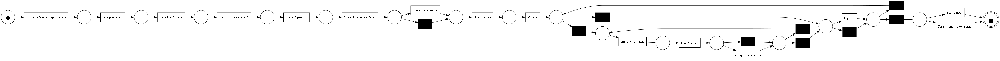

replaying log with TBR, completed traces :: 100%|██████████| 243/243 [00:00<00:00, 478.11it/s]


Fitness token:  {'perc_fit_traces': 100.0, 'average_trace_fitness': 1.0, 'log_fitness': 1.0, 'percentage_of_fitting_traces': 100.0}


replaying log with TBR, completed traces :: 100%|██████████| 243/243 [00:00<00:00, 701.49it/s]


Generalization token:  0.9201759975248693


replaying log with TBR, completed traces :: 100%|██████████| 1997/1997 [00:02<00:00, 672.10it/s]

Precision: 0.49350649350649356
Simplicity: 0.7777777777777779


In [13]:
# Découverte des processus de chaque clusters indépendamment
from pm4py.algo.evaluation.generalization import algorithm as generalization_evaluator
from pm4py.algo.evaluation.simplicity import algorithm as simplicity_evaluator
# Alpha Algorithm


dataframe = pm4py.read_xes("cluster_1.xes")
# dataframe = pm4py.read_xes("hospital_log_medium.xes")
# dataframe = pm4py.read_xes("hospital_log_high.xes")

activity_key='concept:name'
case_id_key='case:case:concept:name'
timestamp_key='time:timestamp'

event_log = pm4py.convert_to_event_log(dataframe,
    activity_key=activity_key,
    case_id_key=case_id_key,
    timestamp_key=timestamp_key
)


# Convertir le modèle heuristique en réseau de Petri
net, im, fm = pm4py.discover_petri_net_inductive(
    dataframe,
    activity_key=activity_key,
    case_id_key=case_id_key,
    timestamp_key=timestamp_key
)

# Visualiser le réseau de Petri
gviz = pm4py.visualization.petri_net.visualizer.apply(net, im, fm)
pm4py.visualization.petri_net.visualizer.view(gviz)

######################"


# Évaluation des métriques
# 1. Fitness
fitness = pm4py.fitness_token_based_replay(event_log, net, im, fm, activity_key=activity_key, case_id_key=case_id_key,timestamp_key=timestamp_key)
print("Fitness token: ", fitness)

# 2. Generalization
gen = pm4py.generalization_tbr(event_log, net, im, fm, activity_key=activity_key, case_id_key=case_id_key ,timestamp_key=timestamp_key)
print("Generalization token: ", gen)

# 3. Precision
prec = pm4py.precision_token_based_replay(event_log, net, im, fm, activity_key=activity_key, case_id_key=case_id_key, timestamp_key=timestamp_key)
print(f"Precision: {prec}")

# 4. Simplicity
simp = simplicity_evaluator.apply(net)
print(f"Simplicity: {simp}")
